<a href="https://colab.research.google.com/github/JustinShawAcademy/Machine-Learning-Zoomcamp/blob/main/03_MLZ_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Churn classification project

## 01-churn-project
The project aims to identify customers that are likely to churn (stop using a service).

Each customer has a score associated with the probability of churning. Considering this data, the company would send an email with discounts or other promotions to avoid churning.

The ML strategy applied to approach this problem is binary classification, which for one instance ($i^{th}$ customer), can be expressed as:

$$\large g\left(x_{i}\right) = y_{i}$$

In the formula, $y_i$ is the model's prediction and belongs to {0,1}, with 0 being the negative value or no churning, and 1 the positive value or churning. The output corresponds to the likelihood of churning.

In essance, we build a model with historical data from customers and assign a score of the likelihood of churning. Just a simple classifcation problem





In [ ]:
import pandas as pd

## 02-data-preperation

In [ ]:
!wget -O telco_classification_data.csv https://github.com/JustinShawAcademy/Machine-Learning-Zoomcamp/raw/refs/heads/main/data/WA_Fn-UseC_-Telco-Customer-Churn.csv

--2025-10-16 19:09:44--  https://github.com/JustinShawAcademy/Machine-Learning-Zoomcamp/raw/refs/heads/main/data/WA_Fn-UseC_-Telco-Customer-Churn.csv
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JustinShawAcademy/Machine-Learning-Zoomcamp/refs/heads/main/data/WA_Fn-UseC_-Telco-Customer-Churn.csv [following]
--2025-10-16 19:09:44--  https://raw.githubusercontent.com/JustinShawAcademy/Machine-Learning-Zoomcamp/refs/heads/main/data/WA_Fn-UseC_-Telco-Customer-Churn.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 977501 (955K) [text/plain]
Saving to: ‘telco_classification_data.csv’

telco_clas

In [ ]:
df = pd.read_csv('telco_classification_data.csv')
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [ ]:
df.head().T

,0,1,2,3,4
customerID,7590-VHVEG,5575-GNVDE,3668-QPYBK,7795-CFOCW,9237-HQITU
gender,Female,Male,Male,Male,Female
SeniorCitizen,0,0,0,0,0
Partner,Yes,No,No,No,No
Dependents,No,No,No,No,No
tenure,1,34,2,45,2
PhoneService,No,Yes,Yes,No,Yes
MultipleLines,No phone service,No,No,No phone service,No
InternetService,DSL,DSL,DSL,DSL,Fiber optic
OnlineSecurity,No,Yes,Yes,Yes,No


### Standardization
NOTE: see 02-regression#standardization for a more step by step understanding

we can clean the column names by converting them to lowercase and replacing spaces with underscores so they’re consistent, easier to reference in code, and less prone to errors when working with different tools or libraries.



In [ ]:
df.columns = df.columns.str.lower().str.replace(' ', '_')

categorical_columns = list(df.dtypes[df.dtypes == 'object'].index)
for c in categorical_columns:
  df[c] = df[c].str.lower().str.replace(' ' , '_')

In [ ]:
df.head().T
# much better

,0,1,2,3,4
customerid,7590-vhveg,5575-gnvde,3668-qpybk,7795-cfocw,9237-hqitu
gender,female,male,male,male,female
seniorcitizen,0,0,0,0,0
partner,yes,no,no,no,no
dependents,no,no,no,no,no
tenure,1,34,2,45,2
phoneservice,no,yes,yes,no,yes
multiplelines,no_phone_service,no,no,no_phone_service,no
internetservice,dsl,dsl,dsl,dsl,fiber_optic
onlinesecurity,no,yes,yes,yes,no


In [ ]:
df.dtypes

,0
customerid,object
gender,object
seniorcitizen,int64
partner,object
dependents,object
tenure,int64
phoneservice,object
multiplelines,object
internetservice,object
onlinesecurity,object


### Problem 1
taking a look at `df.dtypes`, it's unusal to see `totalcharges` of type object. Let's take a look and then convert it.


In [ ]:
df['totalcharges'].head()

,totalcharges
0,29.85
1,1889.5
2,108.15
3,1840.75
4,151.65


In [ ]:
# tc = total charges
tc = pd.to_numeric(df['totalcharges']
                   , errors='coerce') # some rows have a '_' in for their cell
tc.isnull().sum()

np.int64(11)

In [ ]:
df[tc.isnull()][['customerid', 'totalcharges']]

,customerid,totalcharges
488,4472-lvygi,_
753,3115-czmzd,_
936,5709-lvoeq,_
1082,4367-nuyao,_
1340,1371-dwpaz,_
3331,7644-omvmy,_
3826,3213-vvolg,_
4380,2520-sgtta,_
5218,2923-arzlg,_
6670,4075-wkniu,_


In [ ]:
df['totalcharges'] = tc.fillna(0)
df['totalcharges'].isnull().sum()

np.int64(0)

### Problem 2
`churn` must be of numerical type for our machine model to understand. We can convert it with `.astype`

In [ ]:
df['churn'].head()

,churn
0,no
1,no
2,yes
3,no
4,yes


In [ ]:
df['churn'] = (df['churn'] == 'yes').astype(int)
df['churn'].head()

,churn
0,0
1,0
2,1
3,0
4,1


## 03-vaildation

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
df_full_train, df_test = train_test_split(df, test_size=0.2, random_state=1)
print(f"Full train set: {len(df_full_train):,}")
print(f"Test set:       {len(df_test):,}")

Full train set: 5,634
Test set:       1,409


In [ ]:
df_train, df_val = train_test_split(df_full_train, test_size=0.25, random_state=1) # note that 20%/80% = 25%

In [ ]:
print("\nAfter second split:")
print(f"Train set:      {len(df_train):,}")
print(f"Validation set: {len(df_val):,}")
print(f"Test set:       {len(df_test):,}")


After second split:
Train set:      4,225
Validation set: 1,409
Test set:       1,409


In [ ]:
y_train = df_train.churn.values
y_val = df_val.churn.values
y_test = df_test.churn.values

del df_train['churn']
del df_val['churn']
del df_test[ 'churn']

## 04-eda

In [ ]:
df_full_train.isnull().sum()

,0
customerid,0
gender,0
seniorcitizen,0
partner,0
dependents,0
tenure,0
phoneservice,0
multiplelines,0
internetservice,0
onlinesecurity,0


In [ ]:
df_full_train['churn'].value_counts(normalize=True)
# 27% churn rate

,proportion
churn,
0,0.730032
1,0.269968


In [ ]:
global_churn_rate = df_full_train.churn.mean()
round(global_churn_rate, 2)

np.float64(0.27)

In [ ]:
df_full_train.dtypes

,0
customerid,object
gender,object
seniorcitizen,int64
partner,object
dependents,object
tenure,int64
phoneservice,object
multiplelines,object
internetservice,object
onlinesecurity,object


In [ ]:
# we are interested in our 3 numerical values
numerical_columns = ['tenure', 'monthlycharges', 'totalcharges']
categorical_columns = [
    'gender',
    'seniorcitizen',
    'partner',
    'dependents',
    'phoneservice',
    'multiplelines',
    'internetservice',
    'onlinesecurity',
    'onlinebackup',
    'deviceprotection',
    'techsupport',
    'streamingtv',
    'streamingmovies',
    'contract',
    'paperlessbilling',
    'paymentmethod',
]


In [ ]:
df_full_train[categorical_columns].nunique()
# most are binary

,0
gender,2
seniorcitizen,2
partner,2
dependents,2
phoneservice,2
multiplelines,3
internetservice,3
onlinesecurity,3
onlinebackup,3
deviceprotection,3


## 05-risk

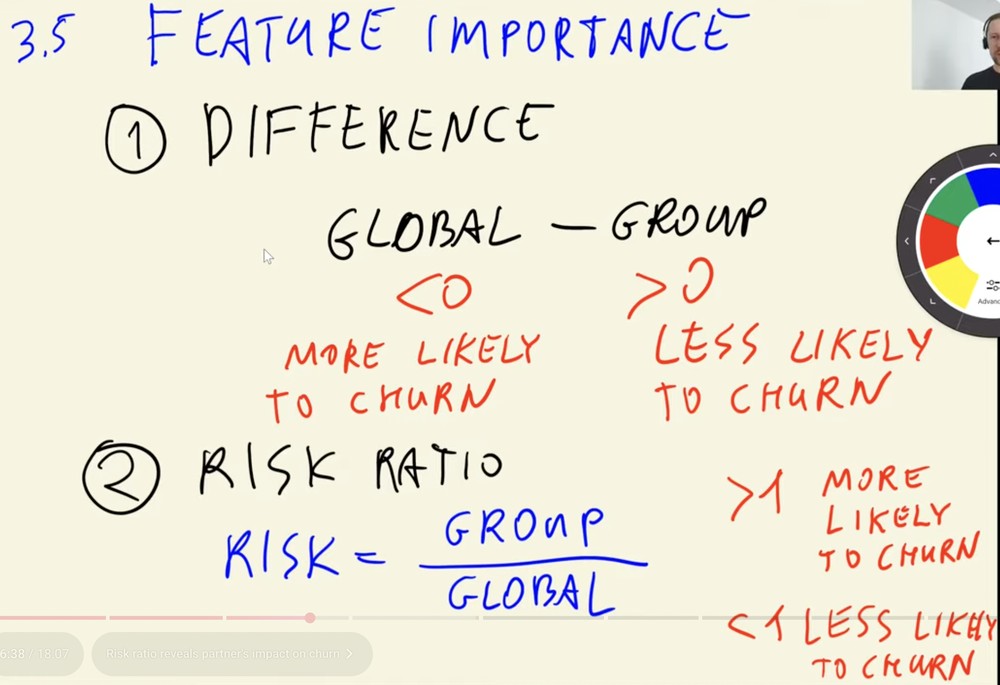

*telling us same information but in just a different way*

In [ ]:
# Female churn rate
churn_female = df_full_train[df_full_train.gender == 'female'].churn.mean()
print(f"Female churn rate: {churn_female:.4f}")

# Male churn rate
churn_male = df_full_train[df_full_train.gender == 'male'].churn.mean()
print(f"Male churn rate:   {churn_male:.4f}")

# Global churn rate
global_churn = df_full_train.churn.mean()
print(f"Global churn rate: {global_churn:.4f}")

# --- Difference from Global Average ---
diff_female = global_churn - churn_female
diff_male   = global_churn - churn_male

print("\nDifference from Global Average")
print(f"Female churn difference: {diff_female:+.6f}")
print(f"Male churn difference:   {diff_male:+.6f}")

Female churn rate: 0.2768
Male churn rate:   0.2632
Global churn rate: 0.2700

Difference from Global Average
Female churn difference: -0.006856
Male churn difference:   +0.006755


In [ ]:
# Churn rate for customers with a partner
churn_partner = df_full_train[df_full_train.partner == 'yes'].churn.mean()
print(f"Churn rate (with partner):  {churn_partner:.4f}")

# Churn rate for customers without a partner
churn_no_partner = df_full_train[df_full_train.partner == 'no'].churn.mean()
print(f"Churn rate (no partner):    {churn_no_partner:.4f}")

# Global churn rate
global_churn = df_full_train.churn.mean()
print(f"Global churn rate:          {global_churn:.4f}")

# --- Difference from Global Average ---

diff_partner = global_churn - churn_partner
diff_no_partner = global_churn - churn_no_partner

print("\nDifference from Global Average")
print(f"With partner:  {diff_partner:+.6f}")
print(f"No partner:    {diff_no_partner:+.6f}")

Churn rate (with partner):  0.2050
Churn rate (no partner):    0.3298
Global churn rate:          0.2700

Difference from Global Average
With partner:  +0.064935
No partner:    -0.059841


- how can we loop this for all the columns?
- can we then view it in a bar chart?

Columns with high abs_diff values are those where churn varies the most between categories.

That means these columns have high predictive power — they’re strong indicators for churn classification.

In the examples above, we can see that with/without partner is more important than male/female gender.

```sql
SELECT
    gender,
    AVG(churn),
    AVG(churn) - global_churn AS diff,
    AVG(churn) / global_churn AS risk
FROM
    data
GROUP BY
    gender;
```

let's do this simply in pandas.

In [ ]:
df_group = df_full_train.groupby('gender').churn.agg(['mean', 'count'])
df_group['diff'] = df_group['mean'] - global_churn
df_group['risk'] = df_group['mean'] / global_churn
df_group

,mean,count,diff,risk
gender,,,,
female,0.276824,2796,0.006856,1.025396
male,0.263214,2838,-0.006755,0.974980


In [ ]:
# df_group won't display because it's in a loop, we ned this:
from IPython.display import display

for c in categorical_columns:
    print(c)
    df_group = df_full_train.groupby(c).churn.agg(['mean', 'count'])
    df_group['diff'] = df_group['mean'] - global_churn
    df_group['risk'] = df_group['mean'] / global_churn
    display(df_group)
    print()
    print()

gender


,mean,count,diff,risk
gender,,,,
female,0.276824,2796,0.006856,1.025396
male,0.263214,2838,-0.006755,0.974980




seniorcitizen


,mean,count,diff,risk
seniorcitizen,,,,
0,0.242270,4722,-0.027698,0.897403
1,0.413377,912,0.143409,1.531208




partner


,mean,count,diff,risk
partner,,,,
no,0.329809,2932,0.059841,1.221659
yes,0.205033,2702,-0.064935,0.759472




dependents


,mean,count,diff,risk
dependents,,,,
no,0.313760,3968,0.043792,1.162212
yes,0.165666,1666,-0.104302,0.613651




phoneservice


,mean,count,diff,risk
phoneservice,,,,
no,0.241316,547,-0.028652,0.893870
yes,0.273049,5087,0.003081,1.011412




multiplelines


,mean,count,diff,risk
multiplelines,,,,
no,0.257407,2700,-0.012561,0.953474
no_phone_service,0.241316,547,-0.028652,0.893870
yes,0.290742,2387,0.020773,1.076948




internetservice


,mean,count,diff,risk
internetservice,,,,
dsl,0.192347,1934,-0.077621,0.712482
fiber_optic,0.425171,2479,0.155203,1.574895
no,0.077805,1221,-0.192163,0.288201




onlinesecurity


,mean,count,diff,risk
onlinesecurity,,,,
no,0.420921,2801,0.150953,1.559152
no_internet_service,0.077805,1221,-0.192163,0.288201
yes,0.153226,1612,-0.116742,0.567570




onlinebackup


,mean,count,diff,risk
onlinebackup,,,,
no,0.404323,2498,0.134355,1.497672
no_internet_service,0.077805,1221,-0.192163,0.288201
yes,0.217232,1915,-0.052736,0.804660




deviceprotection


,mean,count,diff,risk
deviceprotection,,,,
no,0.395875,2473,0.125907,1.466379
no_internet_service,0.077805,1221,-0.192163,0.288201
yes,0.230412,1940,-0.039556,0.853480




techsupport


,mean,count,diff,risk
techsupport,,,,
no,0.418914,2781,0.148946,1.551717
no_internet_service,0.077805,1221,-0.192163,0.288201
yes,0.159926,1632,-0.110042,0.592390




streamingtv


,mean,count,diff,risk
streamingtv,,,,
no,0.342832,2246,0.072864,1.269897
no_internet_service,0.077805,1221,-0.192163,0.288201
yes,0.302723,2167,0.032755,1.121328




streamingmovies


,mean,count,diff,risk
streamingmovies,,,,
no,0.338906,2213,0.068938,1.255358
no_internet_service,0.077805,1221,-0.192163,0.288201
yes,0.307273,2200,0.037305,1.138182




contract


,mean,count,diff,risk
contract,,,,
month-to-month,0.431701,3104,0.161733,1.599082
one_year,0.120573,1186,-0.149395,0.446621
two_year,0.028274,1344,-0.241694,0.104730




paperlessbilling


,mean,count,diff,risk
paperlessbilling,,,,
no,0.172071,2313,-0.097897,0.637375
yes,0.338151,3321,0.068183,1.252560




paymentmethod


,mean,count,diff,risk
paymentmethod,,,,
bank_transfer_(automatic),0.168171,1219,-0.101797,0.622928
credit_card_(automatic),0.164339,1217,-0.105630,0.608733
electronic_check,0.455890,1893,0.185922,1.688682
mailed_check,0.193870,1305,-0.076098,0.718121


## 06-mutual-info

Mutual information - concept from information theory, it tells us how much we can learn about one variable if we know the value of another

https://en.wikipedia.org/wiki/Mutual_information

The higher the mutual information is, the more we learn about the term by observing the value of the other variable

In [ ]:
from sklearn.metrics import mutual_info_score
mutual_info_score(df_full_train.churn, df_full_train.contract)
0.0983203874041556
mutual_info_score(df_full_train.gender, df_full_train.churn)
0.0001174846211139946
mutual_info_score(df_full_train.contract, df_full_train.churn)
0.0983203874041556
mutual_info_score(df_full_train.partner, df_full_train.churn)

np.float64(0.009967689095399745)

In [ ]:
print(mutual_info_score(df_full_train.churn, df_full_train.contract))
print(mutual_info_score(df_full_train.contract, df_full_train.churn))

0.0983203874041556
0.0983203874041556


In [ ]:
print(mutual_info_score(df_full_train.gender, df_full_train.churn))
print(mutual_info_score(df_full_train.churn, df_full_train.gender))

0.0001174846211139946
0.0001174846211139946


let's apply this to the all the variables.

we can use `df.apply()` but this just takes in one argument so we must do that `def` function

In [ ]:
def mutual_info_churn_score(series):
  return mutual_info_score(series, df_full_train.churn)

mi = df_full_train[categorical_columns].apply(mutual_info_churn_score)
mi.sort_values(ascending=False)

,0
contract,0.098320
onlinesecurity,0.063085
techsupport,0.061032
internetservice,0.055868
onlinebackup,0.046923
deviceprotection,0.043453
paymentmethod,0.043210
streamingtv,0.031853
streamingmovies,0.031581
paperlessbilling,0.017589


we can see that contract is the most important and gender is the least important

## 07-correlation

this is a way to measure numerical features. in 06, we used MI to measure catergoical variables.

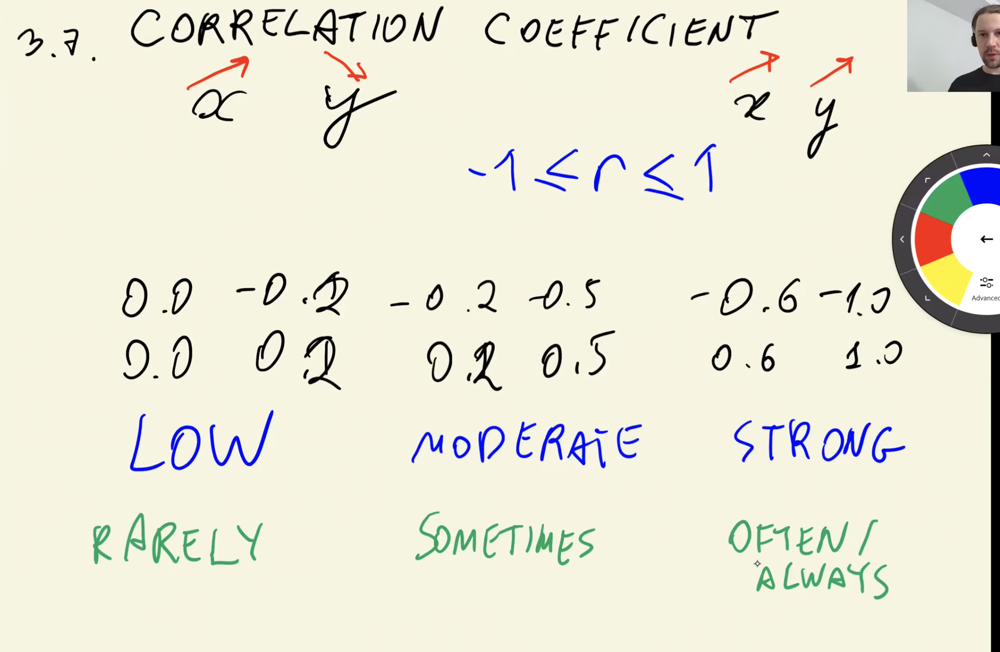

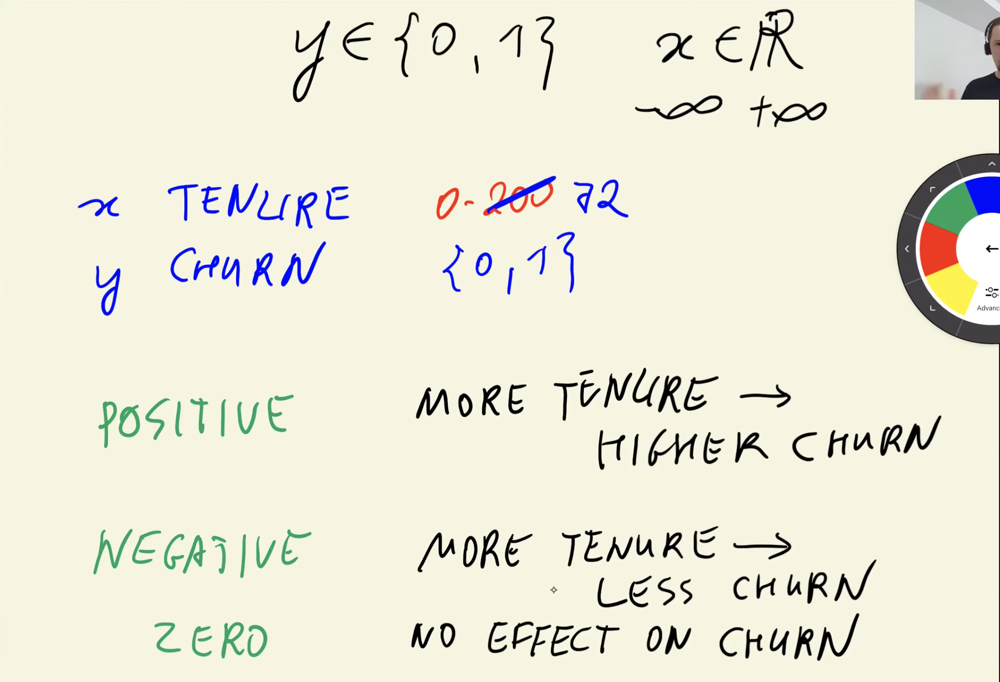

In [ ]:
df_full_train['tenure'].max()

72

In [ ]:
df_full_train[numerical_columns].head()

,tenure,monthlycharges,totalcharges
1814,12,19.70,258.35
5946,42,73.90,3160.55
3881,71,65.15,4681.75
2389,71,85.45,6300.85
3676,30,70.40,2044.75


In [ ]:
df_full_train[numerical_columns].corrwith(df_full_train['churn'])

,0
tenure,-0.351885
monthlycharges,0.196805
totalcharges,-0.196353


Interpratation:

- When `tenure` increases, `churn` rate does down
- When `totalcharges` increases (more people pay), `churn` rate does down
- When `monthlycharges` increases, `churn` rate goes up

We can see below if this correlation matrix intuition is correct.

In [ ]:
features = {
    "tenure": [(0, 2), (2, 12), (12, None)],
    "monthlycharges": [(0, 20), (20, 50), (50, None)]
}

results = []
for feature, ranges in features.items():
    print(f"\nChurn rate by {feature}:")
    for low, high in ranges:
        if high is None:
            mask = df_full_train[feature] > low
            label = f">{low}"
        else:
            mask = (df_full_train[feature] > low) & (df_full_train[feature] <= high)
            label = f"{low}–{high}"
        results.append({
            "Feature": feature,
            "Range": label,
            "Churn Rate": df_full_train[mask].churn.mean()
        })
        print(f"  {label}: {df_full_train[mask].churn.mean():.3f}")

df_churn_summary = pd.DataFrame(results) # used for matplotlib


Churn rate by tenure:
  0–2: 0.602
  2–12: 0.399
  >12: 0.176

Churn rate by monthlycharges:
  0–20: 0.088
  20–50: 0.183
  >50: 0.325


So we can see above, as a customer stays, they're more likly to stay within the company.

and the higher the `monthlycharges` the lease likey that they will stay within the company.

In [ ]:
df_churn_summary

,Feature,Range,Churn Rate
0,tenure,0–2,0.602356
1,tenure,2–12,0.399441
2,tenure,>12,0.176349
3,monthlycharges,0–20,0.087954
4,monthlycharges,20–50,0.183409
5,monthlycharges,>50,0.324993


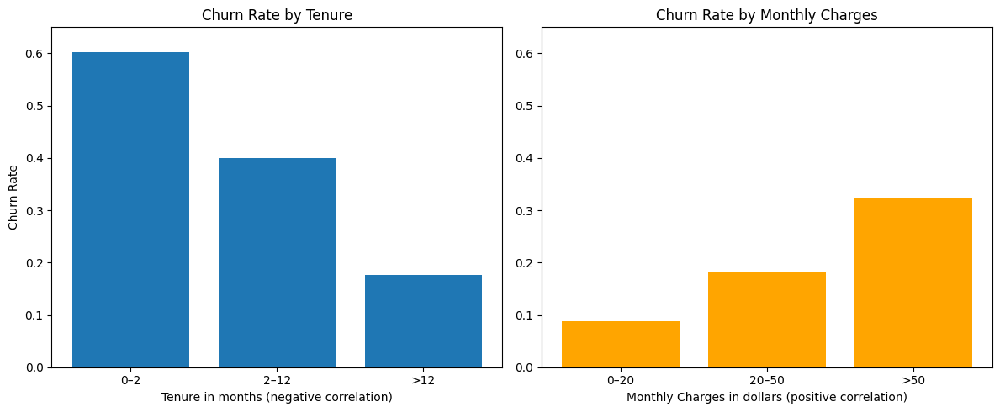

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot 1: Tenure vs churn
tenure_df = df_churn_summary[df_churn_summary["Feature"] == "tenure"]
axes[0].bar(tenure_df["Range"], tenure_df["Churn Rate"])
axes[0].set_title("Churn Rate by Tenure")
axes[0].set_xlabel("Tenure in months (negative correlation)")
axes[0].set_ylabel("Churn Rate")
axes[0].set_ylim(0, 0.65)

# Plot 2: Monthly Charges vs churn
charges_df = df_churn_summary[df_churn_summary["Feature"] == "monthlycharges"]
axes[1].bar(charges_df["Range"], charges_df["Churn Rate"], color="orange")
axes[1].set_title("Churn Rate by Monthly Charges")
axes[1].set_xlabel("Monthly Charges in dollars (positive correlation)")
axes[1].set_ylim(0, 0.65)

plt.tight_layout()
plt.show()


## 08-one-hot-encoding
recall that we did this in #notebook 02 which is used for encoding catergorical variables where in emplemented ohe ourselfs. here, we will use the `sklean` libaray

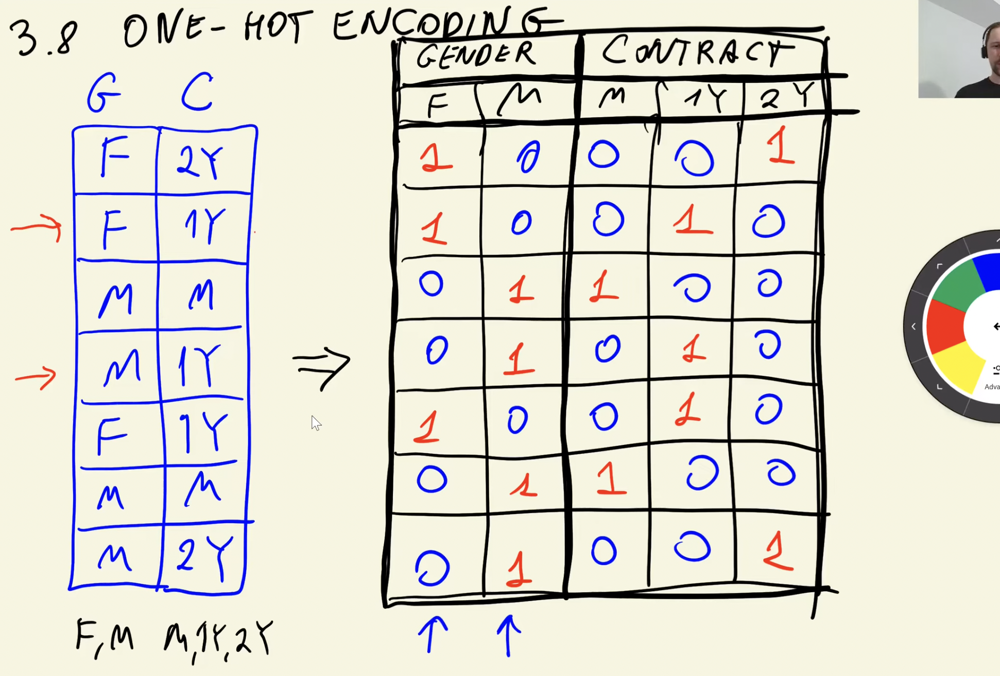

In [ ]:
from sklearn.feature_extraction import DictVectorizer

In [ ]:
df_train[['gender', 'contract']].iloc[:10]

,gender,contract
3897,female,two_year
1980,male,month-to-month
6302,female,month-to-month
727,female,month-to-month
5104,female,two_year
5387,male,month-to-month
459,male,month-to-month
5023,female,month-to-month
6778,female,two_year
1176,female,month-to-month


In [ ]:
# now we want each row to turn into a dictionary
dicts = df_train[['gender', 'contract']].iloc[:20].to_dict(orient='records') # by default, to_dict does cols

In [ ]:
dv = DictVectorizer()

In [ ]:
dv.fit(dicts)

DictVectorizer()

In [ ]:
dv.transform(dicts)

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 40 stored elements and shape (20, 5)>

because we have alot of 0's, it uses a compressed sparse row format. read more about it later.

but for our case, we don't want to use it.

In [ ]:
dv = DictVectorizer(sparse=False)
dv.fit(dicts)

DictVectorizer(sparse=False)

In [ ]:
list(dv.get_feature_names_out())

['contract=month-to-month',
 'contract=one_year',
 'contract=two_year',
 'gender=female',
 'gender=male']

In [ ]:
dv.transform(dicts)

array([[0., 0., 1., 1., 0.],
       [1., 0., 0., 0., 1.],
       [1., 0., 0., 1., 0.],
       [1., 0., 0., 1., 0.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 0., 1.],
       [1., 0., 0., 0., 1.],
       [1., 0., 0., 1., 0.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 1., 0.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 0., 1.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 1., 0.],
       [1., 0., 0., 1., 0.],
       [1., 0., 0., 0., 1.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 1., 0.],
       [0., 1., 0., 0., 1.],
       [0., 0., 1., 0., 1.]])

let's do it will all our features (variables) in our df

In [ ]:
train_dicts = df_train[categorical_columns + numerical_columns].to_dict(orient='records')
train_dicts[0]

{'gender': 'female',
 'seniorcitizen': 0,
 'partner': 'yes',
 'dependents': 'yes',
 'phoneservice': 'yes',
 'multiplelines': 'yes',
 'internetservice': 'fiber_optic',
 'onlinesecurity': 'yes',
 'onlinebackup': 'yes',
 'deviceprotection': 'yes',
 'techsupport': 'yes',
 'streamingtv': 'yes',
 'streamingmovies': 'yes',
 'contract': 'two_year',
 'paperlessbilling': 'yes',
 'paymentmethod': 'electronic_check',
 'tenure': 72,
 'monthlycharges': 115.5,
 'totalcharges': 8425.15}

In [ ]:
dv = DictVectorizer(sparse=False)
dv.fit(train_dicts)

DictVectorizer(sparse=False)

In [ ]:
list(dv.transform(train_dicts)[0])

[np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(115.5),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0),
 np.float64(72.0),
 np.float64(8425.15)]

wrapping it up

In [ ]:
dv = DictVectorizer(sparse=False)

train_dicts = df_train[categorical_columns + numerical_columns].to_dict(orient='records')
X_train = dv.fit_transform(train_dicts)

val_dicts = df_val[categorical_columns + numerical_columns].to_dict(orient='records')
X_val = dv.transform(val_dicts) # already fitted

## 09-logistic-regression

it solves binary problems

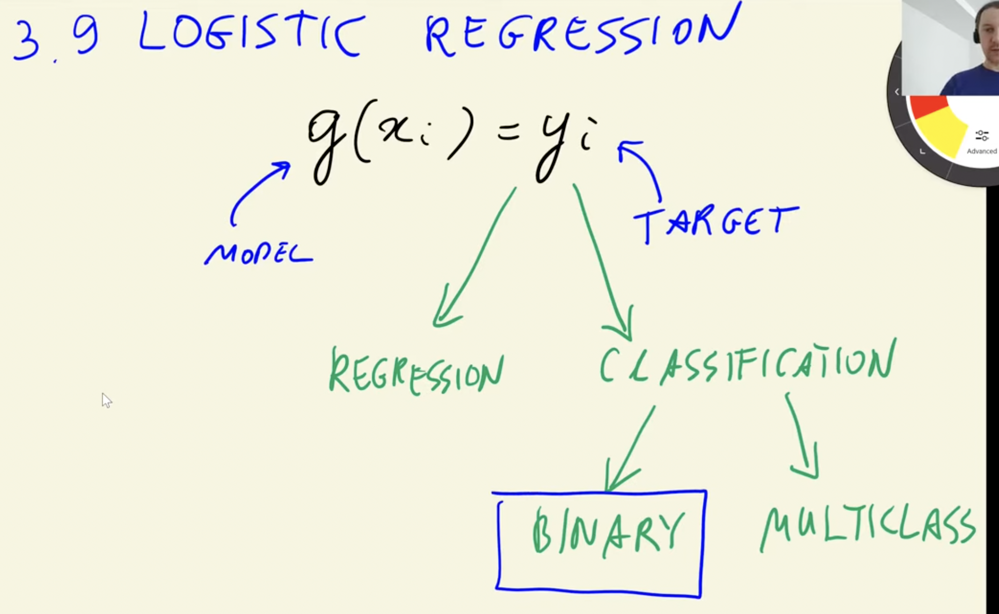

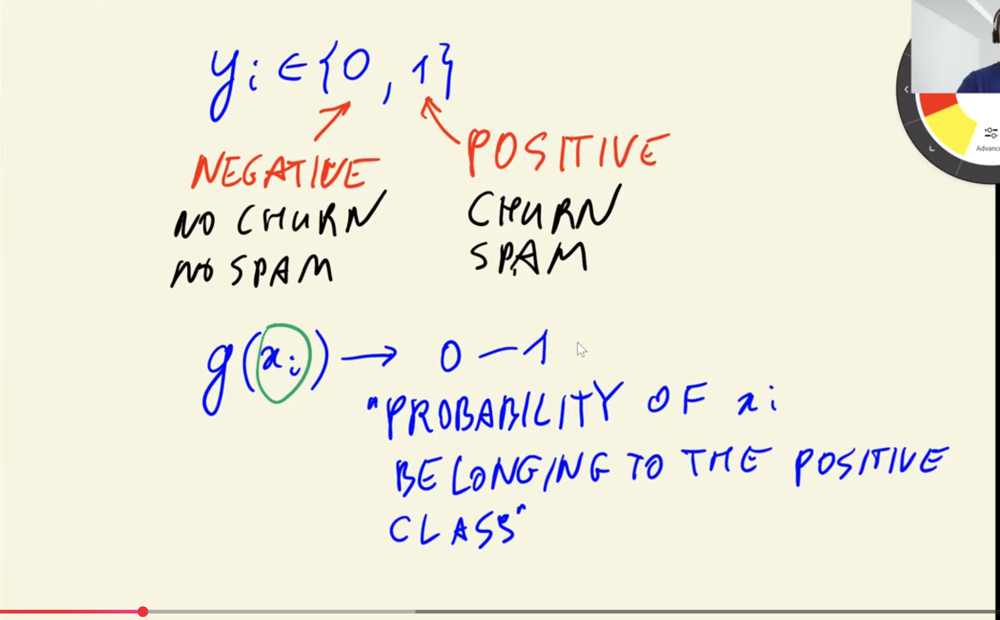

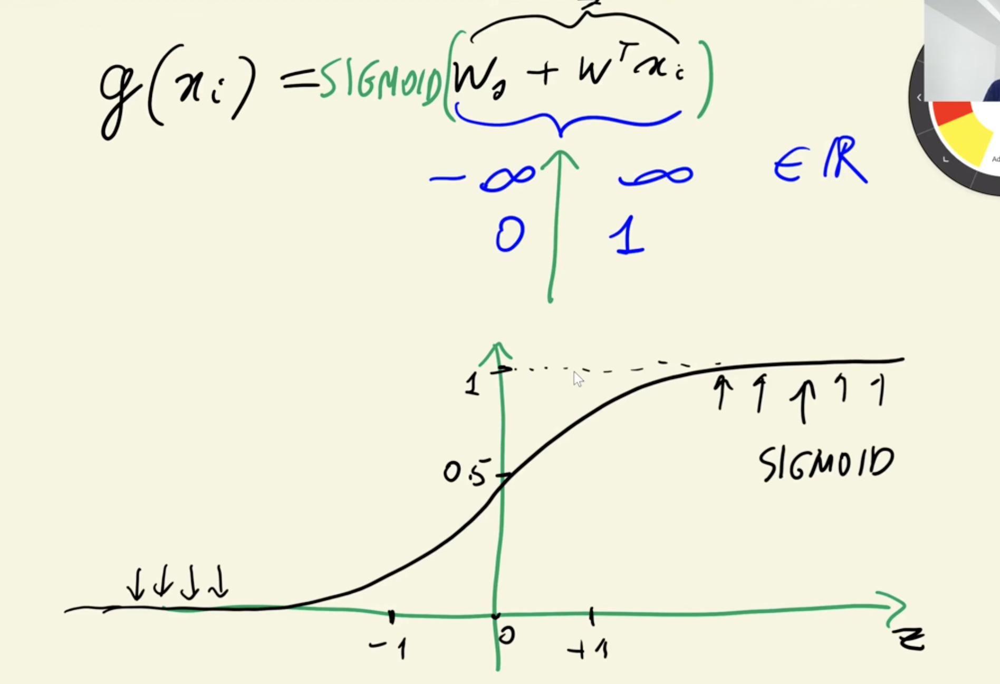

very similar to linear regression but we just wrap it aroudn a sigmoid function

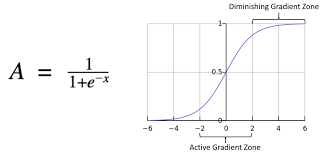

In [ ]:
import numpy as np
def sigmoid(z):
  return 1 / (1 + np.exp(-z))

In [ ]:
z = np.linspace(-5, 5, 51)
z

array([-5. , -4.8, -4.6, -4.4, -4.2, -4. , -3.8, -3.6, -3.4, -3.2, -3. ,
       -2.8, -2.6, -2.4, -2.2, -2. , -1.8, -1.6, -1.4, -1.2, -1. , -0.8,
       -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,  1.4,
        1.6,  1.8,  2. ,  2.2,  2.4,  2.6,  2.8,  3. ,  3.2,  3.4,  3.6,
        3.8,  4. ,  4.2,  4.4,  4.6,  4.8,  5. ])

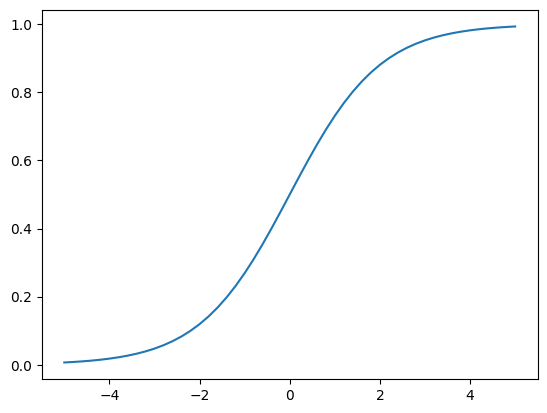

In [ ]:
plt.plot(z, sigmoid(z))

doesn't matter how small or big our input is, our out put is between 0 and 1

In [ ]:
# recall Linear Regression
def linear_regression(xi):
    result = w0
    for j in range(len(w)):
        result = result + xi[j] * w[j]
    return result

In [ ]:
# Logistic Regression is very similar
def logistic_regression(xi):
    score = w0
    for j in range(len(w)):
        score = score + xi[j] * w[j]
    result = sigmoid(score)
    return result

## 10-training-log-reg

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
model = LogisticRegression()
model.fit(X_train, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

Above is a `ConvergenceWarning`, not an error. It means that the optimization algorithm used by `LogisticRegression` to find the best model parameters didn't finish within the default number of iterations.

The warning itself suggests a couple of ways to try and fix this:

1. **Increase the number of iterations**: You can try increasing the `max_iter` parameter when creating the `LogisticRegression` model.
2. **Scale the data**: Scaling your features can sometimes help the optimization process converge faster.

We can get the weights and bias, as seen below

In [ ]:
model.coef_.round(3)

array([[ 0.564, -0.154, -0.519, -0.013, -0.095,  0.071, -0.098, -0.082,
        -0.033, -0.076, -0.354,  0.343, -0.098,  0.002, -0.251,  0.162,
        -0.02 ,  0.066, -0.098, -0.076,  0.251, -0.098, -0.261, -0.228,
         0.119, -0.121,  0.012, -0.095, -0.03 ,  0.045, -0.028,  0.162,
        -0.271,  0.221, -0.097, -0.098,  0.087, -0.05 , -0.098,  0.039,
         0.194, -0.098, -0.205, -0.072,  0.   ]])

In [ ]:
model.intercept_

array([-0.11092874])

In [ ]:
# hard predictions give binary outputs, but we want the probabilities (soft predictions)
model.predict(X_val)

array([0, 0, 0, ..., 0, 1, 1])

on the right hand side, we have prob it is 0 and on the right hand side it is prob it is 1 (churn)

In [ ]:
# soft predictions
model.predict_proba(X_val)

array([[0.99213653, 0.00786347],
       [0.79007197, 0.20992803],
       [0.7762895 , 0.2237105 ],
       ...,
       [0.84985131, 0.15014869],
       [0.22331887, 0.77668113],
       [0.18964226, 0.81035774]])

In [ ]:
y_pred = model.predict_proba(X_val)[:, 1]
y_pred

array([0.00786347, 0.20992803, 0.2237105 , ..., 0.15014869, 0.77668113,
       0.81035774])

Now that we have predictions, let's evaluate our model. Recall that in 02 we used RSME to evauluate but for a classification model, we will use Accuracy

In [ ]:
churn_decision = (y_pred >= 0.5)
churn_decision.astype(int)       # convert from True/False to 1/0

array([0, 0, 0, ..., 0, 1, 1])

In [ ]:
y_val

array([0, 0, 0, ..., 0, 1, 1])

In [ ]:
(y_val == churn_decision).mean()

np.float64(0.801277501774308)

it seems like our model is ~80% right about it's predictions that it's making

In [ ]:
df_pred = pd.DataFrame()
df_pred['probability'] = y_pred
df_pred['prediction'] = churn_decision.astype(int)
df_pred['actual'] = y_val
df_pred.head()

,probability,prediction,actual
0,0.007863,0,0
1,0.209928,0,0
2,0.223710,0,0
3,0.561123,1,1
4,0.219586,0,0


In [ ]:
df_pred['correct'] = df_pred['prediction'] == df_pred['actual']
df_pred.head()

,probability,prediction,actual,correct
0,0.007863,0,0,True
1,0.209928,0,0,True
2,0.223710,0,0,True
3,0.561123,1,1,True
4,0.219586,0,0,True


In [ ]:
df_pred['correct'].mean()

np.float64(0.801277501774308)

## 11-log-reg-interpretation

In [ ]:
len(dv.get_feature_names_out()), len(model.coef_[0])

(45, 45)

Note that logistic regression, the model learns a coefficient for every feature (column) in the training data.

Let's turn it into a dictionary where each feature is mapped to a weight

In [ ]:
dict(zip(dv.get_feature_names_out(), model.coef_[0].round(3)))

{'contract=month-to-month': np.float64(0.564),
 'contract=one_year': np.float64(-0.154),
 'contract=two_year': np.float64(-0.519),
 'dependents=no': np.float64(-0.013),
 'dependents=yes': np.float64(-0.095),
 'deviceprotection=no': np.float64(0.071),
 'deviceprotection=no_internet_service': np.float64(-0.098),
 'deviceprotection=yes': np.float64(-0.082),
 'gender=female': np.float64(-0.033),
 'gender=male': np.float64(-0.076),
 'internetservice=dsl': np.float64(-0.354),
 'internetservice=fiber_optic': np.float64(0.343),
 'internetservice=no': np.float64(-0.098),
 'monthlycharges': np.float64(0.002),
 'multiplelines=no': np.float64(-0.251),
 'multiplelines=no_phone_service': np.float64(0.162),
 'multiplelines=yes': np.float64(-0.02),
 'onlinebackup=no': np.float64(0.066),
 'onlinebackup=no_internet_service': np.float64(-0.098),
 'onlinebackup=yes': np.float64(-0.076),
 'onlinesecurity=no': np.float64(0.251),
 'onlinesecurity=no_internet_service': np.float64(-0.098),
 'onlinesecurity=yes

In [ ]:
small = ['contract', 'tenure', 'monthlycharges']
df_train[small].head()

,contract,tenure,monthlycharges
3897,two_year,72,115.50
1980,month-to-month,10,95.25
6302,month-to-month,5,75.55
727,month-to-month,5,80.85
5104,two_year,18,20.10


In [ ]:
# recall this from * (somehwere above)
df_train[small].iloc[:5].to_dict(orient='records')

[{'contract': 'two_year', 'tenure': 72, 'monthlycharges': 115.5},
 {'contract': 'month-to-month', 'tenure': 10, 'monthlycharges': 95.25},
 {'contract': 'month-to-month', 'tenure': 5, 'monthlycharges': 75.55},
 {'contract': 'month-to-month', 'tenure': 5, 'monthlycharges': 80.85},
 {'contract': 'two_year', 'tenure': 18, 'monthlycharges': 20.1}]

In [ ]:
dicts_train_small = df_train[small].to_dict(orient='records')
dicts_val_small = df_val[small].to_dict(orient='records')

In [ ]:
dv_small = DictVectorizer(sparse=False)
dv_small.fit(dicts_train_small)

DictVectorizer(sparse=False)

In [ ]:
dv_small.get_feature_names_out()

array(['contract=month-to-month', 'contract=one_year',
       'contract=two_year', 'monthlycharges', 'tenure'], dtype=object)

In [ ]:
X_train_small = dv_small.transform(dicts_train_small)
model_small = LogisticRegression()
model_small.fit(X_train_small, y_train)

LogisticRegression()

In [ ]:
w0 = model_small.intercept_[0]
w0

np.float64(-2.477957595829565)

In [ ]:
w = model_small.coef_[0]
w

array([ 0.9711394 , -0.02379507, -0.94828863,  0.02748534, -0.03619005])

In [ ]:
dict(zip(dv_small.get_feature_names_out(), w.round(3)))

{'contract=month-to-month': np.float64(0.971),
 'contract=one_year': np.float64(-0.024),
 'contract=two_year': np.float64(-0.948),
 'monthlycharges': np.float64(0.027),
 'tenure': np.float64(-0.036)}

complete after. make up exaples and plug them into the weights to see the prob go up and down. you should know what to increase and decrease

## 12-using-log-reg

In [ ]:
dicts_full_train = df_full_train[categorical_columns + numerical_columns].to_dict(orient='records')
dv = DictVectorizer(sparse=False)
X_full_train = dv.fit_transform(dicts_full_train)

In [ ]:
y_full_train = df_full_train['churn'].values
y_full_train

array([0, 1, 0, ..., 1, 1, 0])

In [ ]:
model = LogisticRegression()
model.fit(X_full_train, y_full_train)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

now we must do similar to the test data

In [ ]:
dicts_test = df_test[categorical_columns + numerical_columns].to_dict(orient='records')
X_test = dv.transform(dicts_test)

In [ ]:
y_pred = model.predict_proba(X_test)[:,1]
y_pred

array([0.05704183, 0.12942998, 0.32184304, ..., 0.00652234, 0.19165844,
       0.66134701])

In [ ]:
churn_decision = (y_pred >= 0.5)
(churn_decision == y_test).mean()

np.float64(0.8140525195173882)

let's test out our model with only one obersevation

In [ ]:
customer = dicts_test[0]
customer

{'gender': 'female',
 'seniorcitizen': 0,
 'partner': 'no',
 'dependents': 'no',
 'phoneservice': 'yes',
 'multiplelines': 'no',
 'internetservice': 'dsl',
 'onlinesecurity': 'yes',
 'onlinebackup': 'no',
 'deviceprotection': 'yes',
 'techsupport': 'yes',
 'streamingtv': 'yes',
 'streamingmovies': 'yes',
 'contract': 'one_year',
 'paperlessbilling': 'yes',
 'paymentmethod': 'bank_transfer_(automatic)',
 'tenure': 41,
 'monthlycharges': 79.85,
 'totalcharges': 3320.75}

In [ ]:
X_small = dv.transform(customer)
X_small.shape

(1, 45)

In [ ]:
model.predict_proba(X_small)

array([[0.94295817, 0.05704183]])

there is a 5.7% chance that the customer will churn so we will not send him a promotional email (we will classify it as no churn in our threshold >=50)

In [ ]:
y_test[0]

np.int64(0)

and as you can see, we are right. our choice not to send a promotional email is correct because he is not going to churn.